# Part A: Model Code

Write a function to calculate and return the Euclidean distance of two vectors.

In [1]:
def Euclidean_dist(v1, v2):
    import numpy as np
    v1_shape = v1.shape
    v2_shape = v2.shape
    if v1_shape[0] == v2_shape[0]:
        deficit = v1-v2
        deficit_sq = np.square(deficit).reshape(v1_shape[0],1)
        euclidean = np.sqrt(np.sum(deficit_sq, axis = 0))
        return(euclidean)
    else:
        print('Input vectors should be the same shape')


Write a function to calculate and return the Manhattan distance of two vectors.

In [2]:
def Manhattan_dist(v1, v2):
    import numpy as np
    v1_shape = v1.shape
    v2_shape = v2.shape
    if v1_shape[0] == v2_shape[0]:
        deficit = v1-v2
        deficit_abs = np.absolute(deficit).reshape(v1_shape[0],1)
        manhattan = np.sum(deficit_abs, axis = 0)
        return(manhattan)
    else:
        print('Input vectors should be the same shape')

Write a function to calculate and return the accuracy and generalization error of two vectors.

In [3]:
def Accu_Err(y_pred, y):
    import numpy as np
    tp_tn = np.count_nonzero(y-y_pred == 0)    
    accuracy = tp_tn/y.shape[0]
    gen_error = 1-accuracy
    return accuracy,gen_error

Write three functions to compute: precision, recall and F1 score.

In [4]:
def precision(y_pred, y):
    import numpy as np
    tp_fp = np.count_nonzero(y_pred == 1)
    tp = np.count_nonzero(y/y_pred == 1)
    P = tp/tp_fp
    return P

In [5]:
def recall(y_pred, y):
    import numpy as np
    tp = np.count_nonzero(y/y_pred == 1)
    tp_fn = np.count_nonzero(y == 1)
    R = tp/tp_fn
    return R

In [6]:
def F1(y_pred, y):
    P = precision(y_pred, y)
    R = recall(y_pred, y)
    F1 = 2*P*R/(P+R)
    return F1

Write a function to compute the confusion matrix of two vectors.

In [7]:
def CalConfusionMatrix(y_pred, y):
    import numpy as np
    tp = np.count_nonzero(y/y_pred == 1)
    tn = np.count_nonzero(y+y_pred == 0)
    fp = np.count_nonzero(y_pred == 1)-tp
    fn = np.count_nonzero(y_pred == 0)-tn
    ConfusionMatrix = np.array([[tp,fn],[fp,tn]])
    return ConfusionMatrix

In [8]:
import numpy as np
y_pred = np.array([1,0,1,1,1,0,1,0])
y = np.array([1,1,0,1,1,1,1,0])
CalConfusionMatrix(y_pred,y)

array([[4, 2],
       [1, 1]])

Write a function to generate the Receiver Operating Characteristic (ROC) curve.

In [9]:
def Cal_ROC(y, y_pred):
    
    import numpy as np
    FPR = []
    TPR = []
    total_p = np.sum(y)
    total_n = len(y) - total_p
    threshold = np.arange(0.0, 1.01, 0.01)
    for scores in threshold:
        FP, TP =0, 0
        for i in range(len(y_pred)):
            if y_pred[i]>scores:
                if y[i] == 1:
                    TP += 1
                elif y[i] == 0:
                    FP += 1
        FPR.append(FP/float(total_n))
        TPR.append(TP/float(total_p))
    return FPR, TPR


def ROC_Curve(y, y_pred):
    # y_pred are not binary values
    import matplotlib.pyplot as plt
    FPR, TPR = Cal_ROC(y, y_pred)
    plt.figure(figsize = (10,8))
    plt.plot(FPR,TPR, color = 'darkorange',linewidth=5 ,label = 'ROC Curve')
    plt.plot([0,1],[0,1],color = 'navy', linestyle = '--')
    plt.xlim([0,1.05])
    plt.ylim([0,1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC')
    #plt.fill_between(FPR,0,TPR,color='grey')

    plt.legend()
    plt.show()

Write a function to compute area under curve (AUC) for thr ROC curve

In [10]:
def Cal_AUC(y, y_pred):
    # y_pred are not binary values
    FPR, TPR = Cal_ROC(y, y_pred)
    AUC = 0
    for i in range(len(TPR)-1):
        AUC = AUC + 0.5*(TPR[i]+TPR[i+1])*(FPR[i]-FPR[i+1])
    return AUC

20


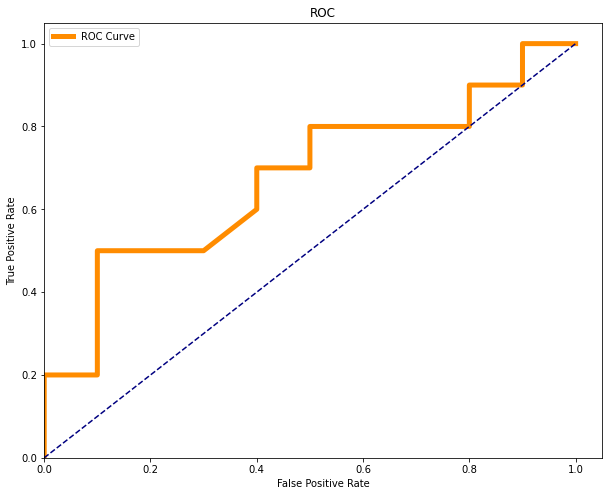

0.675

In [11]:
predict = [0.9,0.8,0.7,0.6,0.55,0.54,0.53,0.52,0.51,0.505,0.4,0.39,0.38,0.37,0.36,0.35,0.34,0.33,0.3,0.1]
ground_truth = [1,1,0,1,1,1,0,0,1,0,1,0,1,0,0,0,1,0,1,0]
print(len(ground_truth))
ROC_Curve(ground_truth, predict)
Cal_AUC(ground_truth,predict)

Write a function to generate the precision-recall curve

In [58]:
def P_R_Curve(y,y_pred):
    # y_pred are not binary values
    import numpy as np
    import matplotlib.pyplot as plt
    y_pred_unique = np.sort(np.unique(y_pred))
    #thresthold = np.arange(0,1.01,0.01)
    total_p = np.count_nonzero(y)
    Precision_list = []
    Recall_list = []
    for pred in y_pred_unique:
        FP, TP =0, 0
        print(pred)
        for i in range(len(y_pred)):
            if y_pred[i] >= pred:
                if y[i] == 1:
                    TP += 1
                elif y[i] == 0:
                    FP += 1
        if TP+FP != 0:
            P = TP/(TP+FP)
            R = TP/total_p
        Precision_list.append(P)
        Recall_list.append(R)
    #special case
    Precision_list.append(1)
    Recall_list.append(0)   
    plt.figure(figsize = (10,8))
    plt.plot(Recall_list,Precision_list, color = 'blue', marker = '.' ,label = 'P-R Curve')
    plt.xlim([0,1.05])
    plt.ylim([0,1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('P-R Curve')

    plt.legend()
    plt.show()



0.1
0.3
0.33
0.34
0.35
0.36
0.37
0.38
0.39
0.4
0.505
0.51
0.52
0.53
0.54
0.55
0.6
0.7
0.8
0.9


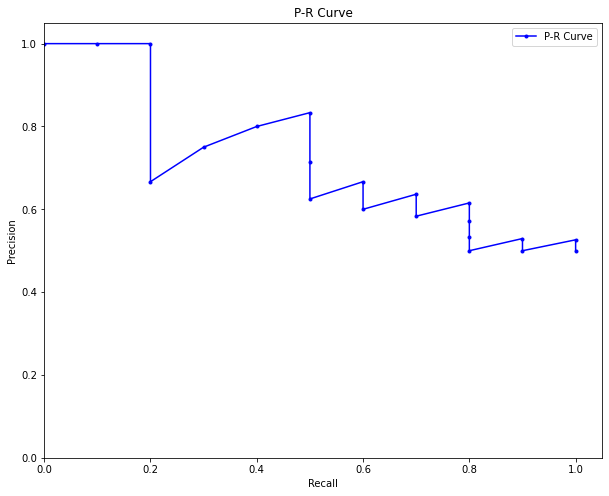

In [59]:
predict = [0.9,0.8,0.7,0.6,0.55,0.54,0.53,0.52,0.51,0.505,0.4,0.39,0.38,0.37,0.36,0.35,0.34,0.33,0.3,0.1]
ground_truth = [1,1,0,1,1,1,0,0,1,0,1,0,1,0,0,0,1,0,1,0]
#ROC_Curve(ground_truth, predict)
P_R_Curve(ground_truth,predict)

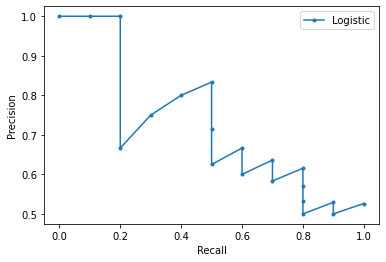

In [14]:
from sklearn.metrics import precision_recall_curve
from matplotlib import pyplot
lr_precision, lr_recall, _ = precision_recall_curve(ground_truth, predict)
pyplot.plot(lr_recall, lr_precision, marker='.', label='Logistic')
# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()

Implement a KNN_Classifier model class. It should have the following three methods:

fit(self, X, Y, n_neighbors, weights, kwargs)

predict(self, X)

__init__(self)

In [15]:
class KNN_Classifier:
    def __init__(self):
        self.fitted = False
    def fit(self, X, Y, n_neighbors, weights = 'uniform', **kwargs):
        '''
        This method simply needs to store the relevant values as instance variables.
        '''
        self.X = X
        self.Y = Y
        self.n_neighbors = n_neighbors
        self.weights = weights
        if kwargs['dis_func'] == 'euclidean':
            self.dist_func = Euclidean_dist
        elif kwargs['dis_func'] == 'manhattan':
            self.dist_func = Manhattan_dist
        self.fitted = True
    def predict(self, x):
        '''
        This method will use the instance variables stored by the fit method.
        x : ndarray
            A numpy array containing samples to be used for prediction. Its rows
            represent data samples and columns represent features.
        '''
        import numpy as np
        y_scores = np.array([])
        prediction = np.array([])
        for m_pred in range(x.shape[0]):
            dist_arr = np.array([])
            class_count = {}
            weights_arr = np.array([])
            total_weights = 0
            x_test_vector = x[m_pred,:].reshape(x.shape[1],1)
            for m_labeled in range(self.X.shape[0]):
                X_labeled = self.X[m_labeled,:].reshape(x.shape[1],1)
                dist = self.dist_func(x_test_vector,X_labeled)
                weight = 1   
                if (self.weights == 'distance'):
                    if dist != 0:
                        weight = 1/dist
                    else:
                        weight = 1/0.000001
                dist_arr = np.append(dist_arr,dist)
                weights_arr = np.append(weights_arr, weight)
            dist_arr.reshape([self.X.shape[0],1])
            weights_arr.reshape([self.X.shape[0],1])
            dist_sort = dist_arr.argsort()
            for i in range(self.n_neighbors):
                vote_labels = self.Y[dist_sort[i]]
                vote_weights = weights_arr[dist_sort[i]]
                total_weights = total_weights+vote_weights
                class_count[int(vote_labels)] = class_count.get(int(vote_labels),0) + vote_weights
                
            sorted_class_cout = sorted(class_count.items(), key = lambda elem: elem[1], reverse= True)
            prob = sorted_class_cout[0][1]/total_weights
            label = sorted_class_cout[0][0]
            prediction = np.append(prediction,label)
            y_scores = np.append(y_scores, prob)
        prediction.reshape([x.shape[0],1])
        self.y_scores = y_scores
        return prediction

# Part B: Data Processing

Read in the csvfile as a Pandas dataframe

In [16]:
import pandas as pd

fdir = 'C:\\Users\\Beichen\\Desktop\\intro_ML_csce878_Fall2020\\assignment1\\data\\winequality-red.csv'
df = pd.read_csv(fdir,delimiter=';')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


The target will be the “quality” column which represents rating of wine and
ranges from 3 to 8. You will need to convert it into a two-category variable
consisting of “good” (quality > 5) & “bad” (quality <= 5). Your target vector
should have 0s (representing “bad” quality wine) and 1s (representing “good”
quality wine).

In [17]:
quality = df.iloc[:,-1]
binary_quality = []
for i in quality:
    if i<= 5:
        bi = 0
    else:
        bi = 1
    binary_quality.append(bi)


Use the techniques from the first recitation to summarize each of the variables in
the dataset in terms of mean, standard deviation, and quartiles. Include this in
your report.

In [18]:
var_list = []
mean_list = []
std_list = []
q1_list = []
q2_list = []
q3_list = []
for i in range(df.shape[1]):
    col_name = df.columns[i]
    col = df.iloc[:,i]
    mean = col.mean(axis=0)
    sd = col.std(axis=0)
    quantile = col.quantile([0.25,0.5,0.75])
    var_list.append(col_name)
    mean_list.append(mean)
    std_list.append(sd)
    q1_list.append(quantile.iloc[0])
    q2_list.append(quantile.iloc[1])
    q3_list.append(quantile.iloc[2])
columns = ['var','mean','std','Q1','Q2','Q3']
df_summary = pd.DataFrame(columns = columns)
df_summary.loc[:,"var"] =var_list 
df_summary.loc[:,"mean"] =mean_list 
df_summary.loc[:,"std"] =std_list 
df_summary.loc[:,"Q1"] =q1_list 
df_summary.loc[:,"Q2"] =q2_list
df_summary.loc[:,"Q3"] =q3_list


In [19]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


Shuffle the rows of your data. You can use def = df.sample(frac=1) as an
idiomatic way to shuffle the data in Pandas without losing column names.

In [20]:
df['Binary_Quality'] = binary_quality
df_rand = df.sample(frac=1)
df_rand

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Binary_Quality
1033,7.5,0.570,0.08,2.6,0.089,14.0,27.0,0.99592,3.30,0.59,10.4,6,1
185,8.9,0.310,0.57,2.0,0.111,26.0,85.0,0.99710,3.26,0.53,9.7,5,0
346,6.6,0.815,0.02,2.7,0.072,17.0,34.0,0.99550,3.58,0.89,12.3,7,1
1321,5.0,0.740,0.00,1.2,0.041,16.0,46.0,0.99258,4.01,0.59,12.5,6,1
1312,8.0,1.180,0.21,1.9,0.083,14.0,41.0,0.99532,3.34,0.47,10.5,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
333,8.4,0.560,0.08,2.1,0.105,16.0,44.0,0.99580,3.13,0.52,11.0,5,0
954,7.6,0.430,0.40,2.7,0.082,6.0,11.0,0.99538,3.44,0.54,12.2,6,1
241,12.0,0.380,0.56,2.1,0.093,6.0,24.0,0.99925,3.14,0.71,10.9,6,1
756,6.3,0.980,0.01,2.0,0.057,15.0,33.0,0.99488,3.60,0.46,11.2,6,1


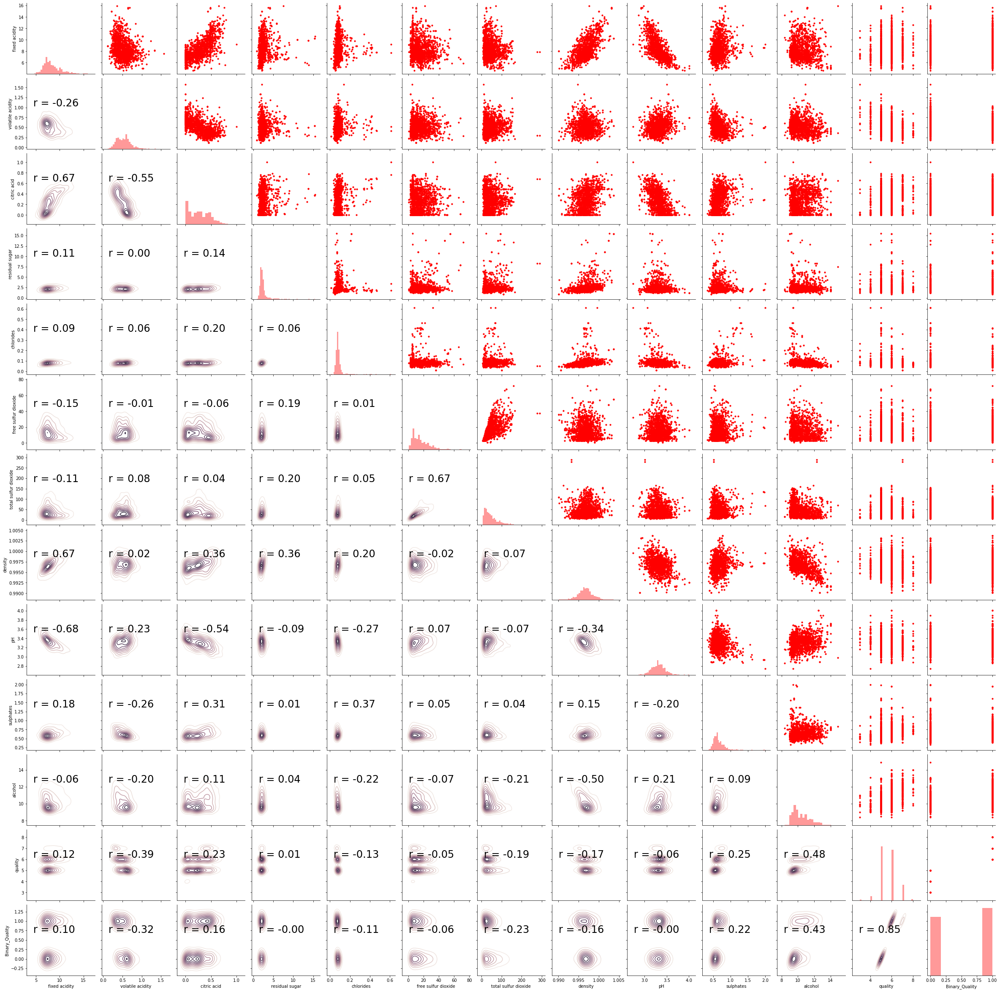

In [21]:
# Matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
from scipy import stats

# Calculate correlation coefficient
def corrfunc(x, y, **kws):
    r, _ = stats.pearsonr(x, y)
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.1, .6), xycoords=ax.transAxes,
               size = 24)
    
cmap = sns.cubehelix_palette(light=1, dark = 0.1,
                             hue = 0.5, as_cmap=True)

sns.set_context(font_scale=2)

# Pair grid set up
g = sns.PairGrid(df)

# Scatter plot on the upper triangle
g.map_upper(plt.scatter, s=10, color = 'red')

# Distribution on the diagonal
g.map_diag(sns.distplot, kde=False, color = 'red')

# Density Plot and Correlation coefficients on the lower triangle
g.map_lower(sns.kdeplot, cmap = cmap)
g.map_lower(corrfunc);

Drop the redundant features.

free sulfur dioxide

citric acid

fixed acidity

residual sugar

ph


In [22]:
df = df.drop(columns = 'quality')
df = df.drop(columns = 'free sulfur dioxide')
df = df.drop(columns = 'citric acid')
df = df.drop(columns = 'fixed acidity')
df = df.drop(columns = 'residual sugar')
df = df.drop(columns = 'ph')
df

,volatile acidity,chlorides,total sulfur dioxide,density,pH,sulphates,alcohol,Binary_Quality
0,0.700,0.076,34.0,0.99780,3.51,0.56,9.4,0
1,0.880,0.098,67.0,0.99680,3.20,0.68,9.8,0
2,0.760,0.092,54.0,0.99700,3.26,0.65,9.8,0
3,0.280,0.075,60.0,0.99800,3.16,0.58,9.8,1
4,0.700,0.076,34.0,0.99780,3.51,0.56,9.4,0
...,...,...,...,...,...,...,...,...
1594,0.600,0.090,44.0,0.99490,3.45,0.58,10.5,0
1595,0.550,0.062,51.0,0.99512,3.52,0.76,11.2,1
1596,0.510,0.076,40.0,0.99574,3.42,0.75,11.0,1
1597,0.645,0.075,44.0,0.99547,3.57,0.71,10.2,0


Write a function named “partition” to split your data into train and test set. 

The function should take 3 arguments: 

feature matrix (numpy array with rows
representing data samples and columns representing features.), 

target vector
(numpy array with labels corresponding to each row of the feature matrix), 

t. Here
t is a real number to determine the size of partition. For example, if t is set to 0.2,
then 80% of the data will be used for training and 20% for testing. 

This function
should return two feature matrices for train and test data, and two target vectors
for train and test data.

In [82]:
def partition(X, y, t):
    import numpy as np
    train_par = 1-t
    sample_size = X.shape[0]
    train_size = int(np.ceil(sample_size*train_par))
    Xy = np.concatenate((X,y), axis = 1)
    Xy_suffled = np.random.shuffle(Xy)
    X_train = Xy[:train_size,:-1]
    y_train = Xy[:train_size,-1]
    X_test = Xy[train_size:,:-1]
    y_test = Xy[train_size:,-1]
    return X_train,y_train, X_test, y_test

X=df.values[:,:-2]
y = df.values[:,-1].reshape([X.shape[0],1])

X_train,y_train, X_test, y_test = partition(X,y,0.2)

In [83]:
knn = KNN_Classifier()
fit = knn.fit(X_train,y_train,5,dis_func = 'euclidean')
pred = knn.predict(X_test)

Use accuracy and F1 score to compare your predictions to the expected
labels.

In [84]:
Accu_Err(pred,y_test)

(0.6833855799373041, 0.3166144200626959)

In [26]:
precision(pred,y_test)

0.6894736842105263

In [27]:
recall(pred,y_test)

0.7797619047619048

In [28]:
F1(pred,y_test)

0.7318435754189945

Now standardize each feature of your training set (subtract mean and
divide by standard deviation). Use the mean and standard deviation values
for each feature in the training set to scale the test data

In [29]:
import numpy as np

X_train_mean = np.mean(X_train, axis=0).reshape(1,X_train.shape[1])
X_train_std = np.std(X_train, axis=0).reshape(1,X_train.shape[1])
X_train_scaled = (X_train-X_train_mean)/X_train_std
X_test_mean = np.mean(X_train, axis=0).reshape(1,X_train.shape[1])
X_test_std = np.std(X_train, axis=0).reshape(1,X_train.shape[1])
X_test_scaled = (X_test-X_train_mean)/X_test_std
knn = KNN_Classifier()
fit = knn.fit(X_train_scaled,y_train,5,dis_func = 'euclidean')
pred = knn.predict(X_test_scaled)

In [30]:
Accu_Err(pred,y_test)

(0.7460815047021944, 0.25391849529780564)

In [31]:
precision(pred,y_test)

0.7457627118644068

In [32]:
recall(pred,y_test)

0.7857142857142857

In [33]:
F1(pred,y_test)

0.7652173913043477

In [79]:
knn = KNN_Classifier()
fit = knn.fit(X_train_scaled,y_train,5,weights = 'distance',dis_func = 'euclidean')
pred = knn.predict(X_test_scaled)

In [80]:
Accu_Err(pred,y_test)

(0.7962382445141066, 0.20376175548589337)

In [36]:
precision(pred,y_test)

0.7845303867403315

In [37]:
recall(pred,y_test)

0.8452380952380952

In [38]:
F1(pred,y_test)

0.813753581661891

# Part C: Model Evaluation

Evaluation of an estimator performance via cross-validation: Implement the
S-fold cross-validation function.

In [39]:
def sFold(folds, data, labels, model, model_args, error_function):
    '''
    i. folds is an integer number of folds.
    ii. data is a numpy array with rows representing data samples and
    columns representing features.
    iii. labels is a numpy array with labels corresponding to each row of
    training_features.
    iv. model is an object with the fit and predict methods.
    v. model args is a dictionary of arguments to pass to the classification
    algorithm. If you are unfamiliar, look up using the ** operator to
    unpack dictionaries as arguments
    vi. error_function
    1. Returns error value between predicted and true labels. For
    example, mean squared error (mse) function could be used
    as error_function.
    '''
    import numpy as np
    folds_size = np.floor(data.shape[0]/folds)
    X_folds = np.array_split(data, folds)
    y_folds = np.array_split(labels, folds)
    y_pred_arr, y_expected, error_arr = np.empty((0,)), np.empty((0,)), np.empty((0,))
    for i in range(folds):
        X_train_par=np.empty((0,data.shape[1]))
        y_train_par=np.empty((0,1))
        X_test_par = X_folds[i]
        y_test_par = y_folds[i]
        for j in range(folds):
            if j != i:
                X_train_par= np.append(X_train_par, X_folds[j], axis=0)
                y_train_par= np.append(y_train_par, y_folds[j], axis=0)
        knn = KNN_Classifier()
        knn.fit(X_train_par,y_train_par,model_args['n_neighbors'],model_args['weights'],dis_func = model_args['dis_func'])
        y_pred_par =  knn.predict(X_test_par).reshape(X_test_par.shape[0],1)
        y_pred_arr = np.append(y_pred_arr, y_pred_par)
        y_expected = np.append(y_expected, y_test_par)
        err = error_function(y_pred_par,y_test_par)
        error_arr = np.append(error_arr, err)
    error_arr = np.mean(error_arr)
    return {'Expected Labels': y_test_par, 'Predicted Labels': y_pred_par, 'Average Error': error_arr}

Use your sfold function to evaluate the performance of your model over each
combination of k and distance metrics from the following sets:

In [40]:
X_mean = np.mean(X, axis=0).reshape(1,X.shape[1])
X_std = np.std(X, axis=0).reshape(1,X.shape[1])
X_scaled = (X-X_mean)/X_std

In [41]:
n_neighbors = [1, 5, 9, 11]
distance = ['euclidean', 'manhattan']
weights = ['uniform','distance']
max_accuracy, best_n, best_weight, best_dist_func = 0, 0, None, None
for n in n_neighbors:
    print('---------------------------------------')
    print('%d neighbors are used in the function.'%n)
    for d in distance:
        for w in weights:
            print(' %s is used to calculate the distance, %s weight is assigned to the nearest neighbors' %(d,w))
            knn = KNN_Classifier()
            fit = knn.fit(X_train_scaled,y_train,n,w,dis_func=d)
            pred = knn.predict(X_test_scaled)
            print(F1(pred,y_test))

---------------------------------------
1 neighbors are used in the function.
 euclidean is used to calculate the distance, uniform weight is assigned to the nearest neighbors
0.7448680351906158
 euclidean is used to calculate the distance, distance weight is assigned to the nearest neighbors
0.7448680351906158
 manhattan is used to calculate the distance, uniform weight is assigned to the nearest neighbors
0.7507331378299119
 manhattan is used to calculate the distance, distance weight is assigned to the nearest neighbors
0.7507331378299119
---------------------------------------
5 neighbors are used in the function.
 euclidean is used to calculate the distance, uniform weight is assigned to the nearest neighbors
0.7652173913043477
 euclidean is used to calculate the distance, distance weight is assigned to the nearest neighbors
0.813753581661891
 manhattan is used to calculate the distance, uniform weight is assigned to the nearest neighbors
0.7741935483870968
 manhattan is used to c

In [42]:
n_neighbors = [1, 5, 9, 11]
distance = ['euclidean', 'manhattan']
weights = ['uniform','distance']
max_accuracy, best_n, best_weight, best_dist_func = 0, 0, None, None
def MSE(y_pred, y):
    import numpy as np
    err_mse = np.sum(np.squre(y_pred - y)).mean()
    return err_mse
for n in n_neighbors:
    print('---------------------------------------')
    print('%d neighbors are used in the function.'%n)
    for d in distance:
        for w in weights:
            print(' %s is used to calculate the distance, %s weight is assigned to the nearest neighbors' %(d,w))
            pred_dictionary = sFold(10, X_scaled, y, KNN_Classifier(), {'n_neighbors': n, 'weights': w, 'dis_func': d}, error_function = F1)
            print('F1 score: %0.4f' %(pred_dictionary['Average Error']))
            if pred_dictionary['Average Error']>max_accuracy:
                max_accuracy = pred_dictionary['Average Error']
                best_n = n
                best_weight = w
                best_dist_func = d
print('the best model is using %d neighbors, %s weight, and %s distance function, with the highest F1 score: %.4f.'%(best_n,best_weight,best_dist_func,max_accuracy))

---------------------------------------
1 neighbors are used in the function.
 euclidean is used to calculate the distance, uniform weight is assigned to the nearest neighbors
F1 score: 0.6411
 euclidean is used to calculate the distance, distance weight is assigned to the nearest neighbors
F1 score: 0.6411
 manhattan is used to calculate the distance, uniform weight is assigned to the nearest neighbors
F1 score: 0.6378
 manhattan is used to calculate the distance, distance weight is assigned to the nearest neighbors
F1 score: 0.6378
---------------------------------------
5 neighbors are used in the function.
 euclidean is used to calculate the distance, uniform weight is assigned to the nearest neighbors
F1 score: 0.6746
 euclidean is used to calculate the distance, distance weight is assigned to the nearest neighbors
F1 score: 0.6690
 manhattan is used to calculate the distance, uniform weight is assigned to the nearest neighbors
F1 score: 0.6697
 manhattan is used to calculate the 

Evaluate your model on the test data and report the performance measures.

In [43]:
knn = KNN_Classifier()
fit = knn.fit(X_train_scaled,y_train,11,dis_func='euclidean')
pred = knn.predict(X_test_scaled)

print('\n Precision: ', precision(pred,y_test))

print('\n Recall: ', recall(pred,y_test))

print('\n F1 score: ', F1(pred, y_test))

print('\n Confusion matrix: \n', CalConfusionMatrix(pred,y_test))

print('\n Test Accuracy and generalization error are: ', Accu_Err(pred,y_test))


 Precision:  0.7365591397849462

 Recall:  0.8154761904761905

 F1 score:  0.7740112994350283

 Confusion matrix: 
 [[137  31]
 [ 49 102]]

 Test Accuracy and generalization error are:  (0.7492163009404389, 0.2507836990595611)


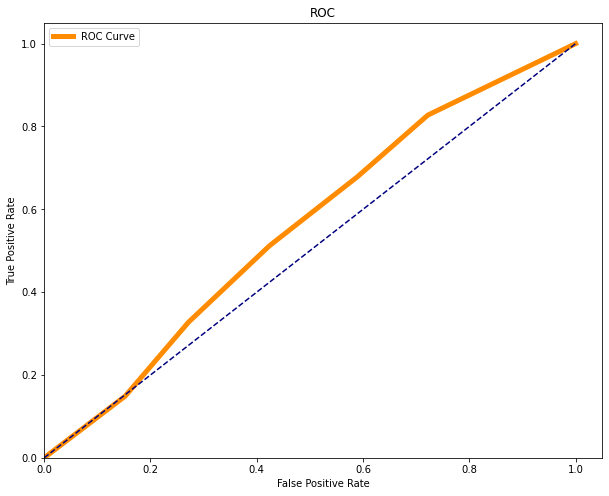

In [44]:
ROC_Curve(y_test,knn.y_scores)

In [45]:
Cal_AUC(y_test,knn.y_scores)

0.5560548722800378

0.5454545454545454
0.6363636363636364
0.7272727272727273
0.8181818181818182
0.9090909090909091
1.0


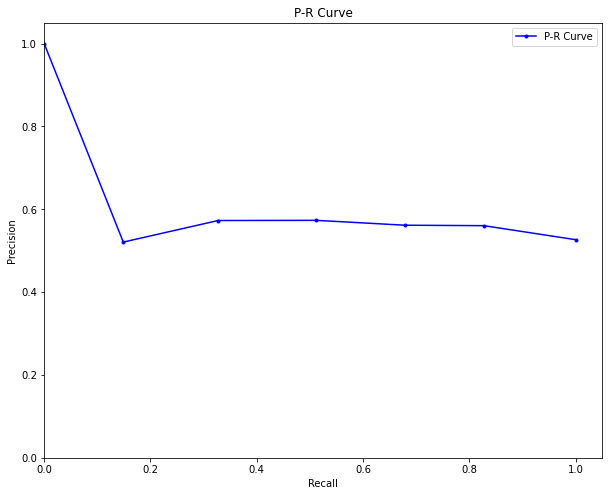

In [60]:
P_R_Curve(y_test,knn.y_scores)


In [47]:
accuracy, gen_error = Accu_Err(pred,y_test)
lower_acc = accuracy - 1.96 * np.sqrt(accuracy * (1 - accuracy) / y_test.shape[0])
upper_acc = accuracy + 1.96 * np.sqrt(accuracy * (1 - accuracy) / y_test.shape[0])
lower_err = gen_error - 1.96 * np.sqrt(gen_error * (1 - gen_error) / y_test.shape[0])
upper_err = gen_error + 1.96 * np.sqrt(gen_error * (1 - gen_error) / y_test.shape[0])

print('Accuracy with 95% confidence interval: {:.3f} - {:.3f}'.format(lower_acc, upper_acc))
print('Generalization Error with 95% Confidence Interval: {:.3f} - {:.3f}'.format(lower_err, upper_err))

Accuracy with 95% confidence interval: 0.702 - 0.797
Generalization Error with 95% Confidence Interval: 0.203 - 0.298


In [85]:
# test in sklearn
from sklearn.neighbors import KNeighborsClassifier

model3 = KNeighborsClassifier(n_neighbors=5, weights='uniform')
model3.fit(X_train,y_train)

#predicted=model.predict_proba(X_testing)
predicted3= model3.predict(X_test)

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
from sklearn.metrics import precision_recall_fscore_support
print("Accuracy:",metrics.accuracy_score(y_test, predicted3))
print("Accuracy:",precision_recall_fscore_support(y_test, predicted3,pos_label=1))

Accuracy: 0.6833855799373041
Accuracy: (array([0.76388889, 0.61714286]), array([0.62146893, 0.76056338]), array([0.68535826, 0.68138801]), array([177, 142], dtype=int64))
